In [103]:
%matplotlib inline
import numpy as np
import skimage.io
from tensorflow import keras
from skimage import color
from skimage.transform import resize
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D

## Load Data

In [2]:
fake_faces_path = '/Users/maxperozek/ML-CP341/8/real_and_fake_face/training_fake/'
real_faces_path = '/Users/maxperozek/ML-CP341/8/real_and_fake_face/training_real/'

In [3]:
def load_ims(path, easy=True):
    ims = []
    for file in os.listdir(path):
        if easy:
            if 'easy' in file:
                im = skimage.io.imread(path + file)
                ims.append(im)
        else:
            im = skimage.io.imread(path + file)
            ims.append(im)
    return ims

In [10]:
fake_faces = load_ims(fake_faces_path, easy=False)

In [5]:
real_faces = load_ims(real_faces_path, easy=False)

In [6]:
len(fake_faces)

240

In [7]:
len(real_faces)

1081

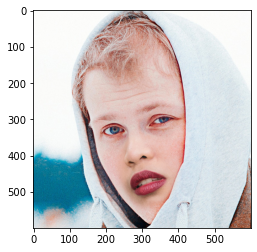

In [8]:
plt.imshow(fake_faces[0])

In [9]:
# yup, that's fucking terrifying

## Simple Pre processing

In [10]:
def reduce_image(im):
    # im = color.rgb2gray(im)
    im = resize(im, (100,100), anti_aliasing=True)
    # im = im.astype("float32") / 255
    return im

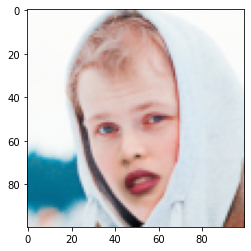

In [11]:
new_im = reduce_image(fake_faces[0])
plt.imshow(new_im)

In [12]:
full_dataset = fake_faces + real_faces[:int(len(real_faces)*0.5)]

In [13]:
for i in range(len(full_dataset)):
    full_dataset[i] = reduce_image(full_dataset[i])

In [14]:
y = np.concatenate((np.ones(len(fake_faces)), np.zeros(len(real_faces[:int(len(real_faces)*0.5)]))))

In [15]:
X = np.array(full_dataset)

In [16]:
X.shape

(780, 100, 100, 3)

In [17]:
X = X.reshape((780,100,100,3))

In [18]:
X.shape[1:]

(100, 100, 3)

In [19]:
y.shape

(780,)

In [20]:
train_pct = 0.9

train_idx = np.random.choice(np.arange(X.shape[0]), int(X.shape[0] * train_pct), replace=False)

test_idx = np.array([i for i in list(np.arange(X.shape[0])) if i not in train_idx])
np.random.shuffle(test_idx)

In [21]:
train_idx.shape

(702,)

In [22]:
test_idx.shape

(78,)

In [23]:
X_train = X[train_idx, :, :, :]
y_train = y[train_idx]

X_test = X[test_idx, :, :, :]
y_test = y[test_idx]

In [24]:
y_train = keras.utils.to_categorical(y_train, 2)
y_test = keras.utils.to_categorical(y_test, 2)

## MTCNN pre processing

In [11]:
from mtcnn.mtcnn import MTCNN
from matplotlib.patches import Rectangle
from PIL import Image

In [12]:
def draw_image_with_boxes(filename, result_list):
    # load the image
    data = plt.imread(filename)
    # plot the image
    plt.imshow(data)
    # get the context for drawing boxes
    ax = plt.gca()
    # plot each box
    for result in result_list:
        # get coordinates
        x, y, width, height = result['box']
        # create the shape
        rect = Rectangle((x, y), width, height, fill=False, color='red')
        # draw the box
        ax.add_patch(rect)
    # show the plot
    plt.show()
    return(x,y,x+width,y+height)

In [13]:
fake_paths = []
real_paths = []

for file in os.listdir(fake_faces_path):
    fake_paths.append(fake_faces_path+file)
    
for file in os.listdir(real_faces_path):
    real_paths.append(real_faces_path+file)

2022-05-08 16:12:36.355354: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


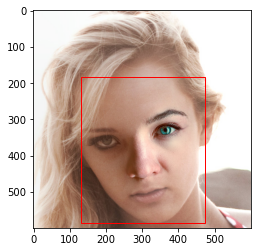

(130, 184, 473, 586)

In [14]:
detector = MTCNN()
filename = fake_paths[10]
# detect faces in the image
pixels = plt.imread(filename)
faces = detector.detect_faces(pixels)
# display faces on the original image
draw_image_with_boxes(filename, faces)

In [15]:
faces[0]

{'box': [130, 184, 343, 402],
 'confidence': 0.9999959468841553,
 'keypoints': {'left_eye': (215, 357),
  'right_eye': (369, 328),
  'nose': (301, 442),
  'mouth_left': (258, 511),
  'mouth_right': (374, 490)}}

In [16]:
def process_dataset_MTCNN(path_list, imsize):
    detector = MTCNN()
    processed = []
    failed = []
    pbar = tqdm(total=len(path_list), position=0, leave=True)
    for path in path_list:
        try:
            pixels = plt.imread(path)
            faces = detector.detect_faces(pixels)
            coordinates = tuple(faces[0]['box'])
            box = (coordinates[0], coordinates[1], coordinates[0] + coordinates[2], coordinates[1] + coordinates[3])
            processed.append(
                resize( np.array(Image.fromarray(pixels).crop(box)), imsize, anti_aliasing=True)
            )
            
            pbar.update(1)
        except (IndexError or SystemError):
            failed.append(path)

    pbar.close()
    return failed, processed

In [24]:
failed, fake_processed = process_dataset_MTCNN(fake_paths, (200,200))

100%|██████████████████████████████████████████████████████████████████████████████████████████▉| 959/960 [09:21<00:00,  1.71it/s]


In [25]:
failed

['/Users/maxperozek/ML-CP341/8/real_and_fake_face/training_fake/easy_57_0010.jpg']

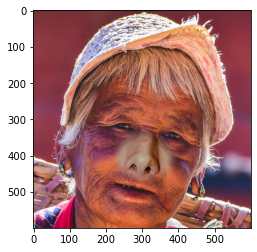

In [26]:
plt.imshow(plt.imread(failed[0]))

In [ ]:
im = plt.imread(failed[0])
min_mean = im - im.mean()
plt.imshow(min_mean)

In [27]:
fake_processed.append(resize(plt.imread(failed[0]), (200,200), anti_aliasing=True))

In [28]:
fake_processed[0].shape

(200, 200, 3)

In [22]:
failed, real_processed = process_dataset_MTCNN(real_paths, (200,200))

100%|████████████████████████████████████████████████████████████████████████████████████████▌| 1076/1081 [10:53<00:03,  1.65it/s]


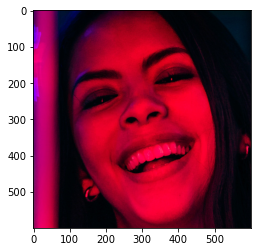

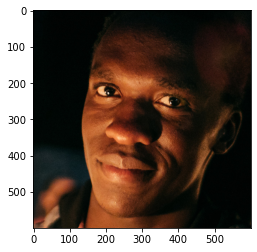

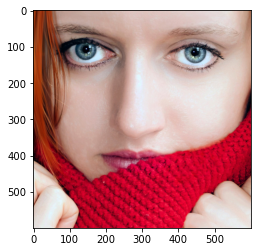

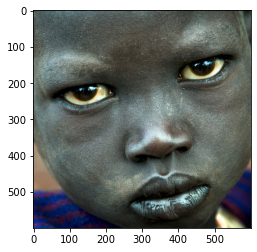

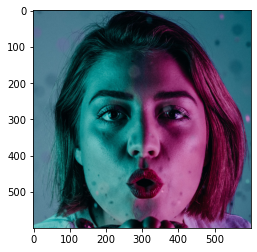

In [23]:
for path in failed:
    plt.imshow(plt.imread(path))
    plt.show()

The faces that were not able to be detected by MTCNN are disproportionately non-white. Granted, most of these images are not 'easy', as there is poor/ uncommon lighting or partially obscured faces.

In [65]:
easy_idx = [i for i in range(len(fake_paths)) if 'easy' in fake_paths[i]]
easy_mask = np.array([True if i in easy_idx else False for i in range(len(fake_processed))])

In [69]:
fake_processed_easy = np.array(fake_processed)[easy_mask]

In [73]:
def im_list_2_mat(fake_processed, real_processed):
    n_fake = len(fake_processed)
    n_real = len(real_processed)
    c_X = np.empty((n_fake+n_real, 200, 200, 3))
    c_y = np.concatenate((np.ones(n_fake), np.zeros(n_real)))
    for i in np.arange(n_fake):
        c_X[i] = fake_processed[i]
    for i in np.arange(n_fake, n_fake+n_real, 1):
        c_X[i] = real_processed[i-n_fake]
    
    return c_X, c_y

In [75]:
c_X, c_y = im_list_2_mat(fake_processed_easy, real_processed)

In [76]:
print(c_X.shape)
print(c_y.shape)

(1316, 200, 200, 3)
(1316,)


In [77]:
train_pct = 0.9

train_idx_c = np.random.choice(np.arange(c_X.shape[0]), int(c_X.shape[0] * train_pct), replace=False)

test_idx_c = np.array([i for i in list(np.arange(c_X.shape[0])) if i not in train_idx_c])
np.random.shuffle(test_idx_c)

In [78]:
train_idx_c.shape

(1184,)

In [79]:
test_idx_c.shape

(132,)

## Save matrix

In [105]:
import torch

In [106]:
X_to_save, y_to_save = im_list_2_mat(fake_processed, real_processed)

In [107]:
torch.save(X_to_save, 'full_X.pt')
torch.save(y_to_save, 'full_y.pt')

## Load / Split Data

In [80]:
X_train_c = c_X[train_idx_c, :, :, :]
y_train_c = c_y[train_idx_c]

X_test_c = c_X[test_idx_c, :, :, :]
y_test_c = c_y[test_idx_c]

In [42]:
# y_train_c = keras.utils.to_categorical(y_train_c, 2)
# y_test_c = keras.utils.to_categorical(y_test_c, 2)

## Build CNN

In [227]:
def build_CNN(X):
    model = Sequential()
    model.add(Conv2D(64, (3,3), activation='relu', input_shape=X.shape[1:]))
    model.add(Dropout(0.5))
    
    model.add(Conv2D(32, (3,3), activation='relu'))
    model.add(Dropout(0.5))
    
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    return model

In [228]:
model = build_CNN(X)

In [79]:
model.fit(X_train, y_train , epochs=20, batch_size=10)

Epoch 1/20
46/46 [==============================] - 9s 189ms/step - loss: 1.0910 - accuracy: 0.4924 - val_loss: 0.6942 - val_accuracy: 0.1600
Epoch 2/20
46/46 [==============================] - 9s 184ms/step - loss: 0.6926 - accuracy: 0.5076 - val_loss: 0.6947 - val_accuracy: 0.1600
Epoch 3/20
46/46 [==============================] - 9s 187ms/step - loss: 0.6925 - accuracy: 0.5272 - val_loss: 0.6963 - val_accuracy: 0.1600
Epoch 4/20
46/46 [==============================] - 9s 190ms/step - loss: 0.6920 - accuracy: 0.5599 - val_loss: 0.6981 - val_accuracy: 0.1600
Epoch 5/20
46/46 [==============================] - 9s 190ms/step - loss: 0.6966 - accuracy: 0.5599 - val_loss: 0.7006 - val_accuracy: 0.1600
Epoch 6/20
46/46 [==============================] - 9s 190ms/step - loss: 0.6935 - accuracy: 0.5294 - val_loss: 0.6999 - val_accuracy: 0.1600
Epoch 7/20
46/46 [==============================] - 9s 198ms/step - loss: 0.6937 - accuracy: 0.5381 - val_loss: 0.7016 - val_accuracy: 0.1200
Epoch 

In [80]:
_, accuracy = model.evaluate(X_test, y_test)
print(accuracy)

1/1 [==============================] - 0s 120ms/step - loss: 1.1069 - accuracy: 0.6538
0.6538461446762085


In [372]:
def build_CNN_bigger(X):
    model = Sequential()
    
    model.add(Conv2D(32, (3,3), activation='leaky_relu', input_shape=X.shape[1:]))
    model.add(Dropout(0.2))
    
    model.add(Conv2D(128, (3,3), activation='leaky_relu'))
    model.add(Dropout(0.2))
    
    model.add(Conv2D(64, (3,3), activation='relu'))
    model.add(Dropout(0.2))
    
    model.add(Conv2D(16, (3,3), activation='leaky_relu'))
    model.add(Dropout(0.2))
    
    model.add(Flatten())
    # model.add(Dropout(0.25))

    model.add(Dense(16, activation='leaky_relu'))
    model.add(Dropout(0.2))
    
    model.add(Dense(8, activation='leaky_relu'))
    model.add(Dropout(0.2))

    model.add(Dense(2, activation='softmax'))
    
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

In [373]:
big_model = build_CNN_bigger(X)

In [374]:
big_model.summary()

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_128 (Conv2D)         (None, 98, 98, 32)        896       
                                                                 
 dropout_180 (Dropout)       (None, 98, 98, 32)        0         
                                                                 
 conv2d_129 (Conv2D)         (None, 96, 96, 128)       36992     
                                                                 
 dropout_181 (Dropout)       (None, 96, 96, 128)       0         
                                                                 
 conv2d_130 (Conv2D)         (None, 94, 94, 64)        73792     
                                                                 
 dropout_182 (Dropout)       (None, 94, 94, 64)        0         
                                                                 
 conv2d_131 (Conv2D)         (None, 92, 92, 16)      

In [375]:
big_model.fit(X_train, y_train , epochs=30, batch_size=16, validation_split=0.1)

Epoch 1/30
40/40 [==============================] - 50s 1s/step - loss: 0.8857 - accuracy: 0.5990 - val_loss: 0.5827 - val_accuracy: 0.7324
Epoch 2/30
40/40 [==============================] - 47s 1s/step - loss: 0.6427 - accuracy: 0.6719 - val_loss: 0.5782 - val_accuracy: 0.7324
Epoch 3/30
40/40 [==============================] - 47s 1s/step - loss: 0.6484 - accuracy: 0.6862 - val_loss: 0.5906 - val_accuracy: 0.7324
Epoch 4/30
40/40 [==============================] - 47s 1s/step - loss: 0.6344 - accuracy: 0.6846 - val_loss: 0.5897 - val_accuracy: 0.7324
Epoch 5/30
40/40 [==============================] - 47s 1s/step - loss: 0.6319 - accuracy: 0.6878 - val_loss: 0.5827 - val_accuracy: 0.7324
Epoch 6/30
40/40 [==============================] - 47s 1s/step - loss: 0.6200 - accuracy: 0.6846 - val_loss: 0.5898 - val_accuracy: 0.7324
Epoch 7/30
40/40 [==============================] - 47s 1s/step - loss: 0.6260 - accuracy: 0.6783 - val_loss: 0.6940 - val_accuracy: 0.7324
Epoch 8/30
40/40 [==

In [376]:
_, accuracy = big_model.evaluate(X_test, y_test)
print(accuracy)

3/3 [==============================] - 1s 393ms/step - loss: 3.2325 - accuracy: 0.7051
0.7051281929016113


In [381]:
y_test

array([[0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.

In [389]:
big_model.predict(X_train)

array([[1.6012238e-22, 1.0000000e+00],
       [9.9993873e-01, 6.1299921e-05],
       [9.9301732e-01, 6.9827321e-03],
       ...,
       [4.8688257e-01, 5.1311743e-01],
       [9.7113818e-01, 2.8861796e-02],
       [1.0000000e+00, 8.4923087e-21]], dtype=float32)

In [377]:
preds = np.argmax(big_model.predict(X_train), axis=1)

In [378]:
preds

array([1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0,
       1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,

In [402]:
def build_CNN_bigger_1(X):
    model = Sequential()
    
    model.add(Conv2D(32, (3,3), activation='leaky_relu', input_shape=X.shape[1:]))
    model.add(Dropout(0.25))
    
    model.add(Conv2D(128, (3,3), activation='leaky_relu'))
    model.add(Dropout(0.25))
    
    model.add(Conv2D(64, (3,3), activation='relu'))
    model.add(Dropout(0.25))
    
    model.add(Conv2D(16, (3,3), activation='leaky_relu'))
    model.add(Dropout(0.25))
    
    model.add(Flatten())

    model.add(Dense(16, activation='leaky_relu'))
    model.add(Dropout(0.25))
    
    model.add(Dense(8, activation='leaky_relu'))
    model.add(Dropout(0.5))

    model.add(Dense(2, activation='softmax'))
    
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

In [406]:
model2 = build_CNN_bigger_1(X)

In [87]:
class_weight = {0: 1.,
                1: 4.}

In [408]:
model2.fit(X_train, y_train , epochs=30, batch_size=16, validation_split=0.1, class_weight=class_weight)

Epoch 1/30
40/40 [==============================] - 68s 2s/step - loss: 1.0127 - accuracy: 0.4913 - val_loss: 0.6645 - val_accuracy: 0.7324
Epoch 2/30
40/40 [==============================] - 69s 2s/step - loss: 0.9155 - accuracy: 0.5515 - val_loss: 0.6808 - val_accuracy: 0.7324
Epoch 3/30
40/40 [==============================] - 62s 2s/step - loss: 0.9113 - accuracy: 0.6276 - val_loss: 0.6849 - val_accuracy: 0.7324
Epoch 4/30
 3/40 [=>............................] - ETA: 57s - loss: 0.9258 - accuracy: 0.6458

KeyboardInterrupt: 

In [410]:
preds = np.argmax(model2.predict(X_train), axis=1)

In [411]:
preds

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

## A Promising Model...

In [81]:
def build_CNN_w_pooling(X):    
    model = Sequential()

    model.add(Conv2D(32,(3,3),input_shape=X.shape[1:] ,activation = 'relu',padding='same',))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.2))

    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(0.2))

    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(0.2))

    model.add(Flatten())

    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer = 'adam',loss = 'binary_crossentropy',metrics = ['accuracy'])
    
    return model


In [100]:
model3 = build_CNN_w_pooling(c_X)

In [101]:
class_weight = {0: 1.,
                1: 4.2}

In [102]:
model3.fit(X_train_c, y_train_c , epochs=30, batch_size=32, validation_split=0.1, class_weight=class_weight)

Epoch 1/30
34/34 [==============================] - 41s 1s/step - loss: 1.3283 - accuracy: 0.6141 - val_loss: 0.6931 - val_accuracy: 0.4706
Epoch 2/30
34/34 [==============================] - 40s 1s/step - loss: 1.1067 - accuracy: 0.5840 - val_loss: 0.6908 - val_accuracy: 0.7395
Epoch 3/30
34/34 [==============================] - 40s 1s/step - loss: 1.1101 - accuracy: 0.5568 - val_loss: 0.6921 - val_accuracy: 0.3950
Epoch 4/30
34/34 [==============================] - 42s 1s/step - loss: 1.1107 - accuracy: 0.4394 - val_loss: 0.6989 - val_accuracy: 0.2017
Epoch 5/30
34/34 [==============================] - 43s 1s/step - loss: 1.1086 - accuracy: 0.5427 - val_loss: 0.6960 - val_accuracy: 0.1513
Epoch 6/30
34/34 [==============================] - 44s 1s/step - loss: 1.1093 - accuracy: 0.6282 - val_loss: 0.6924 - val_accuracy: 0.7983
Epoch 7/30
34/34 [==============================] - 43s 1s/step - loss: 1.1077 - accuracy: 0.5052 - val_loss: 0.6921 - val_accuracy: 0.8487
Epoch 8/30
34/34 [==

In [108]:
_, accuracy = model3.evaluate(X_test_c, y_test_c)
print(accuracy)

5/5 [==============================] - 4s 460ms/step - loss: 0.9591 - accuracy: 0.6136
0.6136363744735718


In [110]:
preds = model3.predict(X_test_c)

## ROC Curve

In [115]:
# https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/

In [104]:
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [111]:
ns_probs = [0 for _ in range(len(y_test_c))]

ns_auc = roc_auc_score(y_test_c, ns_probs)
mod_auc = roc_auc_score(y_test_c, preds)

In [114]:
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('CNN: ROC AUC=%.3f' % (mod_auc))

No Skill: ROC AUC=0.500
CNN: ROC AUC=0.590


In [117]:
ns_fpr, ns_tpr, _ = roc_curve(y_test_c, ns_probs)
mod_fpr, mod_tpr, _ = roc_curve(y_test_c, preds)

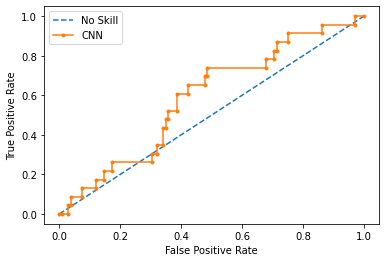

In [121]:
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
plt.plot(mod_fpr, mod_tpr, marker='.', label='CNN')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()

plt.show()

In [122]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score

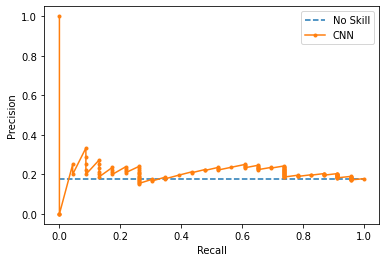

In [124]:
cnn_precision, cnn_recall, _ = precision_recall_curve(y_test_c, preds)
# lr_f1, lr_auc = f1_score(testy, yhat), auc(lr_recall, lr_precision)
# # summarize scores
# print('Logistic: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))

# # plot the precision-recall curves
no_skill = len(y_test_c[y_test_c==1]) / len(y_test_c)


plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
plt.plot(cnn_recall, cnn_precision, marker='.', label='CNN')
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show()

## Model saving

In [230]:
# model3.save('/Users/maxperozek/ML-CP341/8/saved-models/model1')

2022-05-07 17:50:31.131774: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: /Users/maxperozek/ML-CP341/8/saved-models/assets


In [231]:
loaded = keras.models.load_model('/Users/maxperozek/ML-CP341/8/saved-models/model1')

In [234]:
loaded.fit(X_train_c, y_train_c , epochs=30, batch_size=16, validation_split=0.1, class_weight=class_weight)

Epoch 1/30
67/67 [==============================] - 11s 156ms/step - loss: 0.4455 - accuracy: 0.8930 - val_loss: 0.8005 - val_accuracy: 0.7899
Epoch 2/30
67/67 [==============================] - 10s 156ms/step - loss: 0.3888 - accuracy: 0.9174 - val_loss: 0.8961 - val_accuracy: 0.6471
Epoch 3/30
67/67 [==============================] - 11s 158ms/step - loss: 0.3789 - accuracy: 0.9089 - val_loss: 0.8360 - val_accuracy: 0.7563
Epoch 4/30
67/67 [==============================] - 11s 161ms/step - loss: 0.3924 - accuracy: 0.9146 - val_loss: 0.7570 - val_accuracy: 0.7059
Epoch 5/30
67/67 [==============================] - 11s 162ms/step - loss: 0.2941 - accuracy: 0.9352 - val_loss: 0.8376 - val_accuracy: 0.7059
Epoch 6/30
67/67 [==============================] - 11s 162ms/step - loss: 0.3180 - accuracy: 0.9127 - val_loss: 0.9512 - val_accuracy: 0.6723
Epoch 7/30
67/67 [==============================] - 11s 168ms/step - loss: 0.2691 - accuracy: 0.9465 - val_loss: 0.9125 - val_accuracy: 0.7227

In [235]:
_, accuracy = loaded.evaluate(X_test_c, y_test_c)
print(accuracy)

5/5 [==============================] - 0s 66ms/step - loss: 1.5327 - accuracy: 0.6818
0.6818181872367859


In [240]:
preds = loaded.predict(X_test_c)

pred:  [0.21074405] truth:  0.0


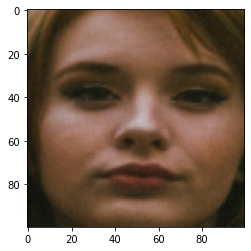

pred:  [0.03915238] truth:  1.0


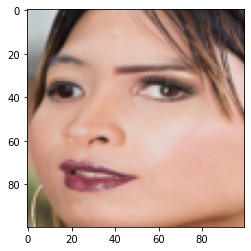

pred:  [0.8883561] truth:  0.0


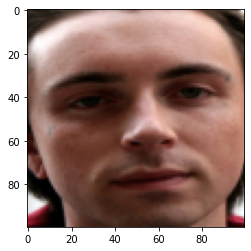

pred:  [0.09728605] truth:  0.0


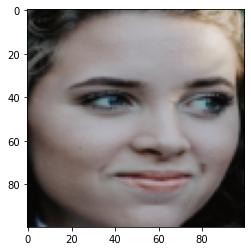

pred:  [0.9144396] truth:  0.0


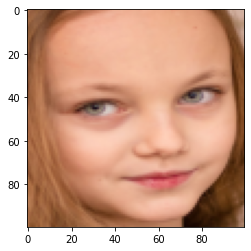

pred:  [0.15990075] truth:  0.0


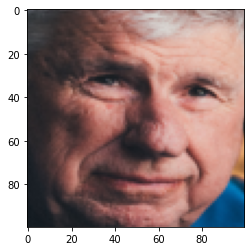

pred:  [0.00017101] truth:  0.0


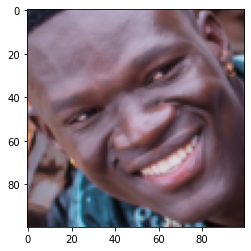

pred:  [1.1415445e-06] truth:  0.0


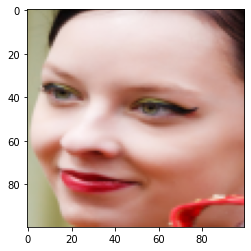

pred:  [4.638386e-06] truth:  1.0


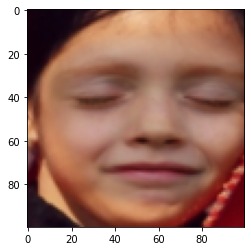

pred:  [0.27775824] truth:  0.0


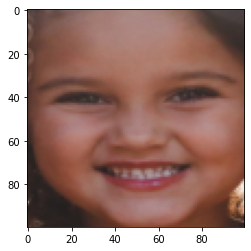

pred:  [0.7703828] truth:  0.0


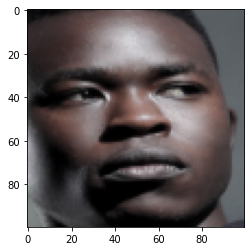

pred:  [1.4608064e-05] truth:  1.0


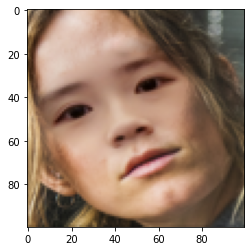

pred:  [0.1148701] truth:  0.0


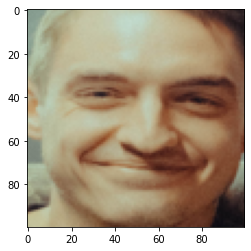

pred:  [0.08352602] truth:  0.0


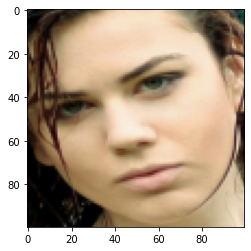

pred:  [0.00034213] truth:  0.0


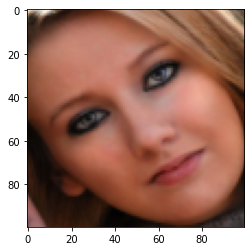

pred:  [9.477701e-05] truth:  1.0


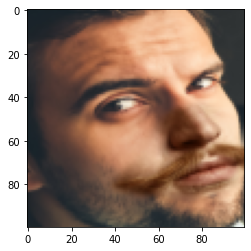

pred:  [0.23346508] truth:  1.0


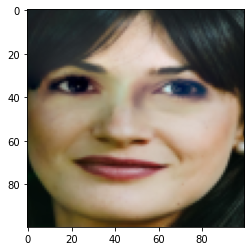

pred:  [0.99773073] truth:  0.0


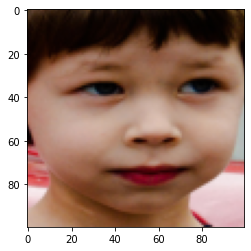

pred:  [0.36637112] truth:  0.0


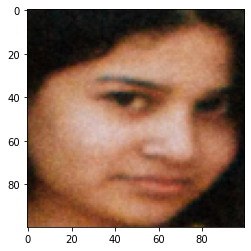

pred:  [0.18875208] truth:  0.0


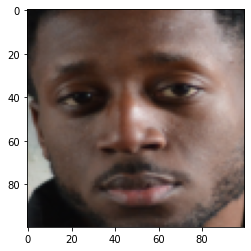

pred:  [0.02340174] truth:  1.0


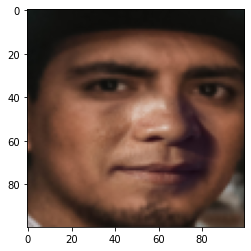

pred:  [0.00527221] truth:  0.0


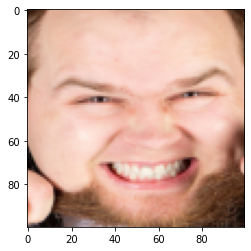

pred:  [0.01626006] truth:  0.0


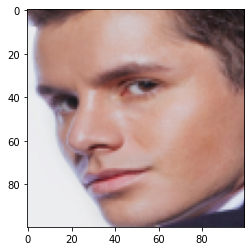

pred:  [0.00533253] truth:  0.0


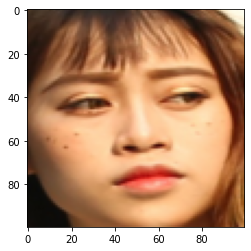

pred:  [0.25235736] truth:  0.0


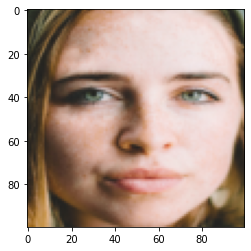

pred:  [0.00889766] truth:  0.0


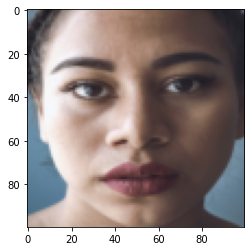

pred:  [0.33635485] truth:  0.0


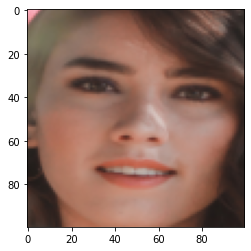

pred:  [0.0560858] truth:  0.0


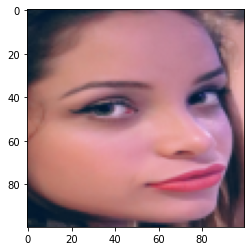

pred:  [0.18365315] truth:  1.0


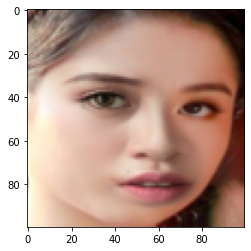

pred:  [0.9999856] truth:  0.0


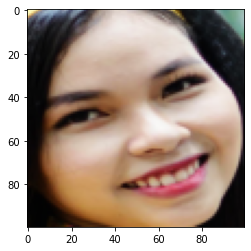

pred:  [0.01239696] truth:  1.0


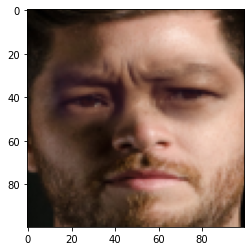

pred:  [0.9064751] truth:  1.0


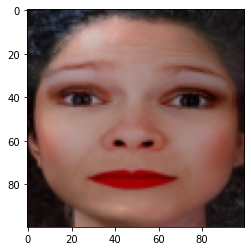

pred:  [0.01047966] truth:  0.0


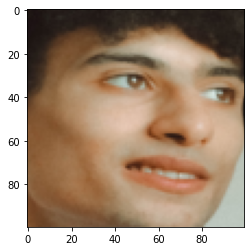

pred:  [0.00603947] truth:  0.0


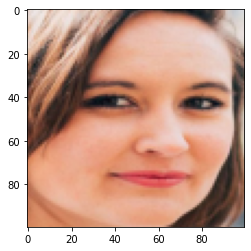

pred:  [0.09758714] truth:  0.0


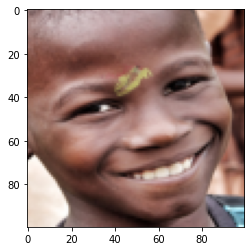

pred:  [1.6054517e-07] truth:  1.0


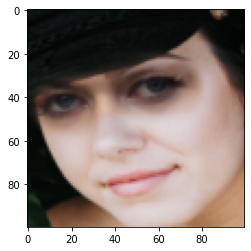

pred:  [9.505309e-05] truth:  0.0


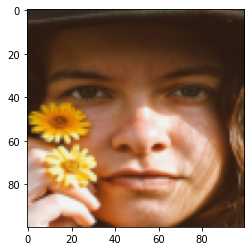

pred:  [0.00557974] truth:  0.0


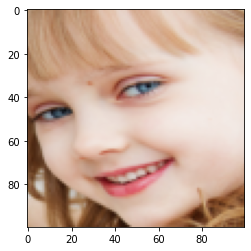

pred:  [0.05060831] truth:  0.0


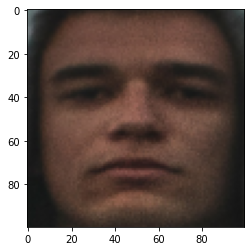

pred:  [1.00306046e-07] truth:  0.0


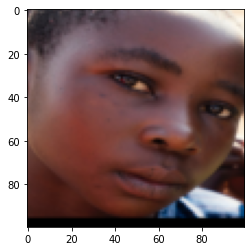

pred:  [0.70597523] truth:  0.0


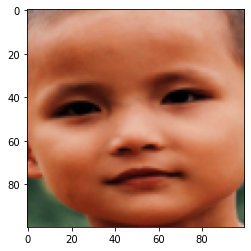

pred:  [0.04206562] truth:  0.0


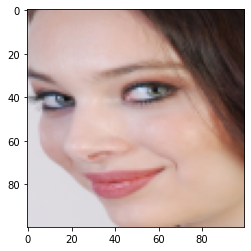

pred:  [0.00357887] truth:  0.0


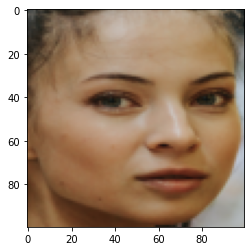

pred:  [0.00311106] truth:  0.0


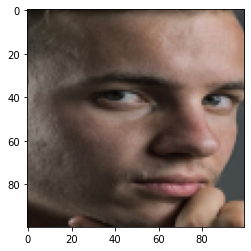

pred:  [1.2297446e-05] truth:  0.0


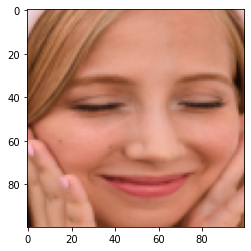

pred:  [0.0738031] truth:  0.0


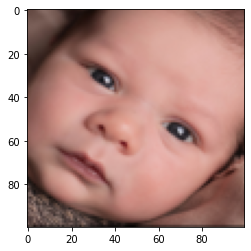

pred:  [0.00023746] truth:  0.0


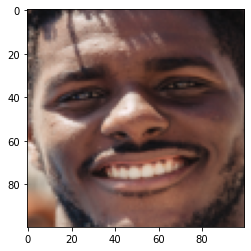

pred:  [1.834614e-23] truth:  0.0


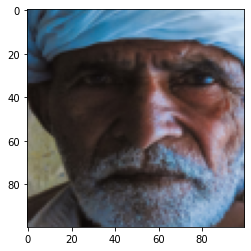

pred:  [0.00208351] truth:  0.0


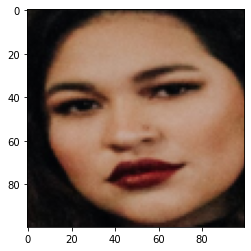

pred:  [0.00056458] truth:  1.0


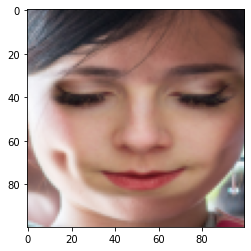

pred:  [0.091719] truth:  0.0


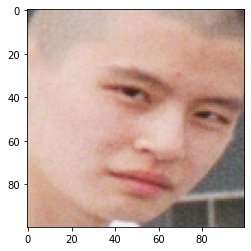

pred:  [0.697882] truth:  0.0


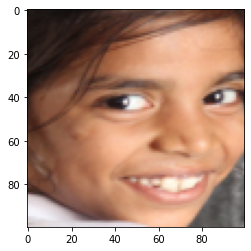

pred:  [0.44852346] truth:  0.0


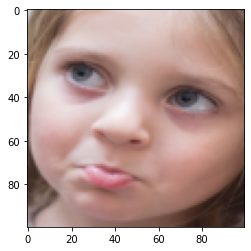

pred:  [0.00084195] truth:  0.0


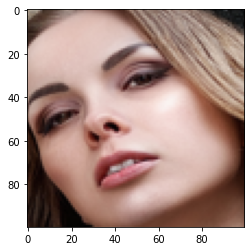

pred:  [1.3760343e-05] truth:  1.0


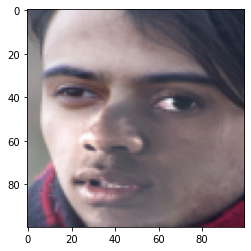

pred:  [0.00388303] truth:  1.0


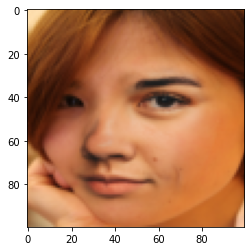

pred:  [0.2536981] truth:  1.0


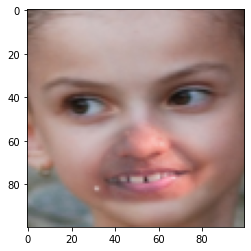

pred:  [0.0005289] truth:  0.0


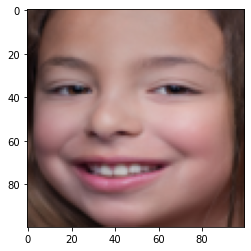

pred:  [8.055379e-11] truth:  0.0


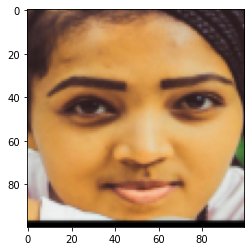

pred:  [0.1348347] truth:  0.0


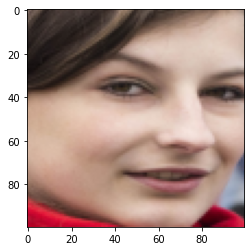

pred:  [0.851011] truth:  0.0


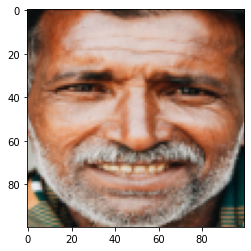

pred:  [0.08815283] truth:  1.0


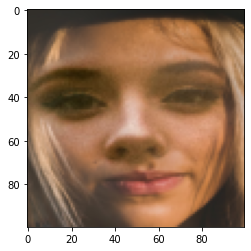

pred:  [0.02650309] truth:  0.0


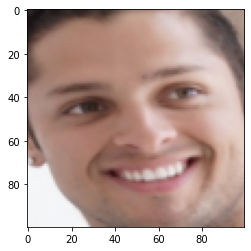

pred:  [0.41753894] truth:  0.0


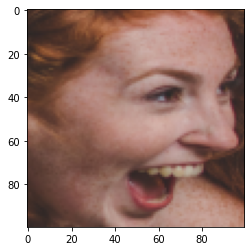

pred:  [0.00620431] truth:  0.0


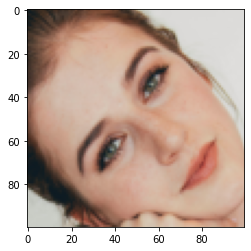

pred:  [0.14809519] truth:  0.0


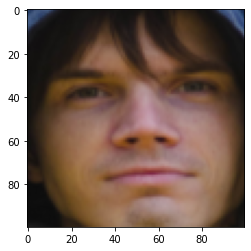

pred:  [0.00104585] truth:  0.0


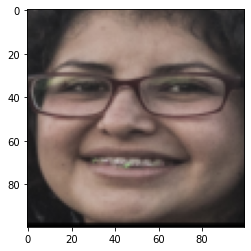

pred:  [0.00398803] truth:  0.0


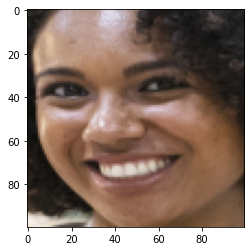

pred:  [0.06576687] truth:  0.0


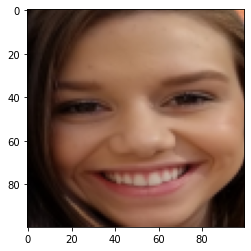

pred:  [4.489992e-06] truth:  0.0


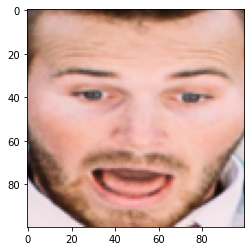

pred:  [0.7988031] truth:  0.0


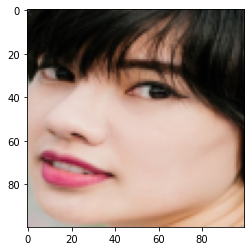

pred:  [0.41467717] truth:  1.0


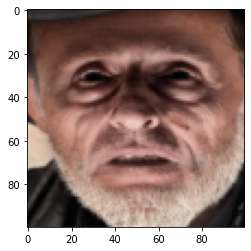

pred:  [4.444463e-06] truth:  0.0


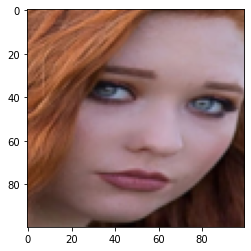

pred:  [0.34586594] truth:  1.0


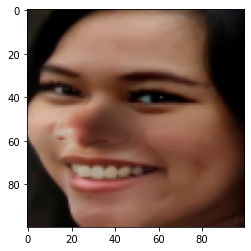

pred:  [0.] truth:  0.0


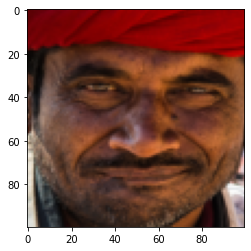

pred:  [0.9456357] truth:  0.0


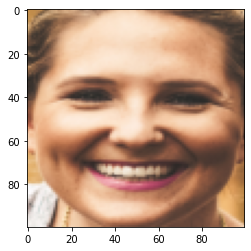

pred:  [0.00097525] truth:  0.0


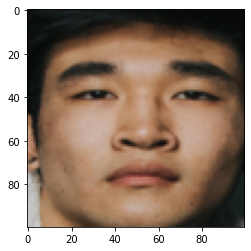

pred:  [0.83532435] truth:  0.0


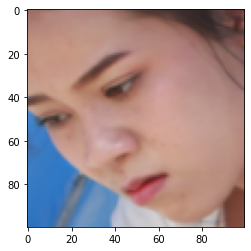

pred:  [0.28890616] truth:  1.0


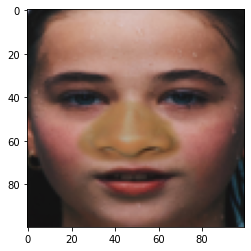

pred:  [6.465727e-07] truth:  0.0


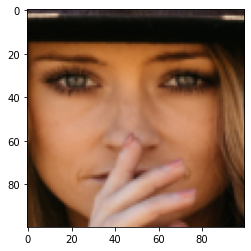

pred:  [0.05183268] truth:  0.0


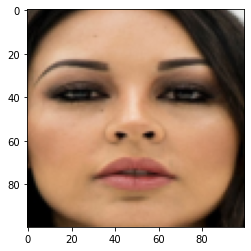

pred:  [0.999979] truth:  0.0


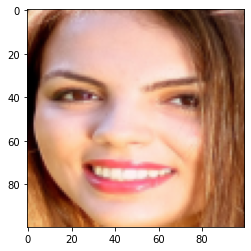

pred:  [0.0022836] truth:  0.0


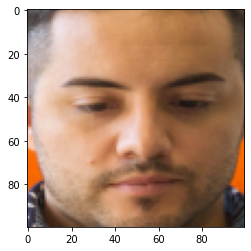

pred:  [4.054768e-10] truth:  0.0


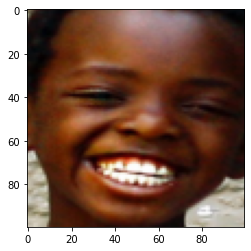

pred:  [0.9994713] truth:  0.0


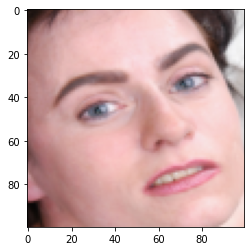

pred:  [1.00157995e-05] truth:  0.0


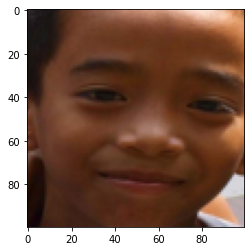

pred:  [0.06314752] truth:  0.0


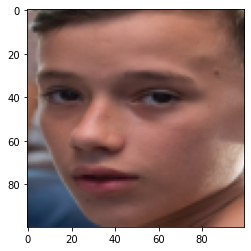

pred:  [0.385845] truth:  0.0


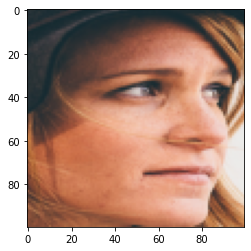

pred:  [0.00205374] truth:  0.0


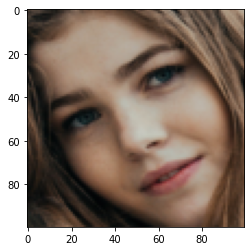

pred:  [0.03289568] truth:  1.0


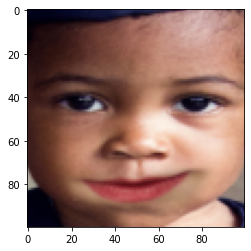

pred:  [0.01453033] truth:  0.0


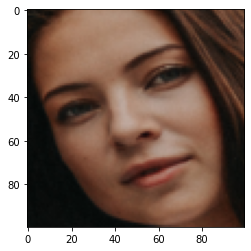

pred:  [0.0287807] truth:  1.0


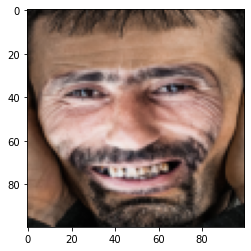

pred:  [0.17940602] truth:  0.0


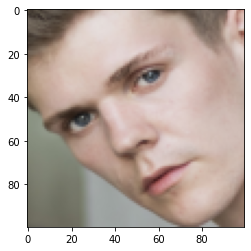

pred:  [0.838512] truth:  1.0


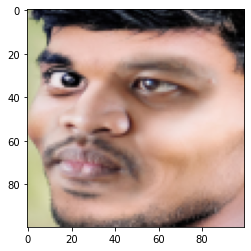

pred:  [5.640327e-08] truth:  0.0


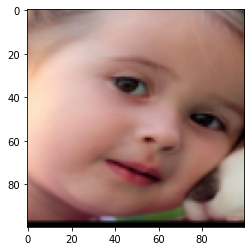

pred:  [0.30607527] truth:  0.0


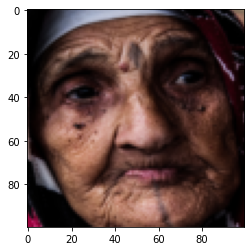

pred:  [0.25529242] truth:  0.0


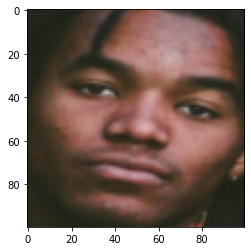

pred:  [4.5399367e-22] truth:  0.0


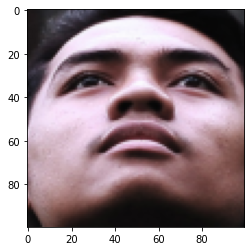

pred:  [0.6658577] truth:  0.0


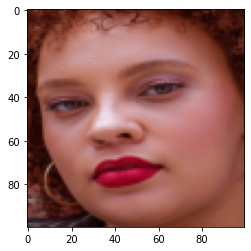

pred:  [0.04842851] truth:  0.0


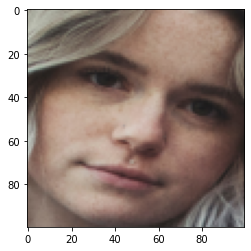

pred:  [0.09544727] truth:  0.0


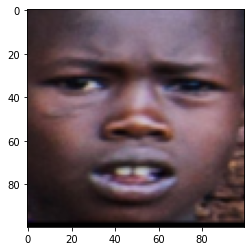

pred:  [0.8243966] truth:  0.0


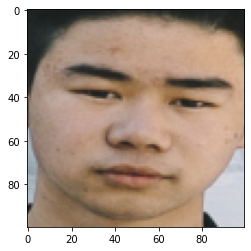

pred:  [0.022194] truth:  0.0


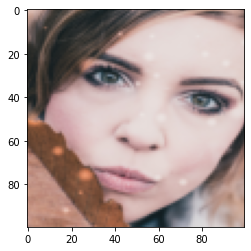

pred:  [0.1167624] truth:  0.0


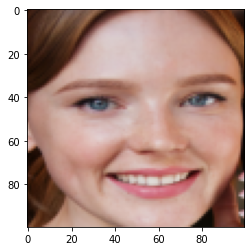

pred:  [8.931812e-07] truth:  0.0


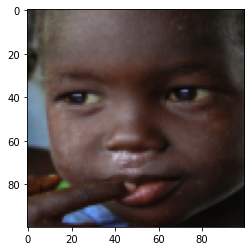

pred:  [0.00200126] truth:  0.0


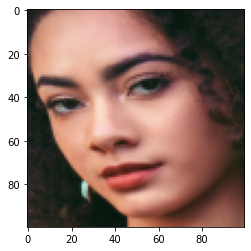

pred:  [0.00017211] truth:  0.0


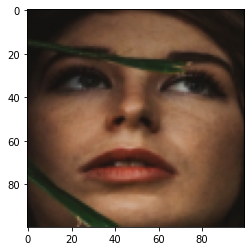

pred:  [3.1288732e-07] truth:  0.0


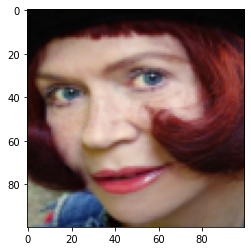

pred:  [4.1869507e-07] truth:  0.0


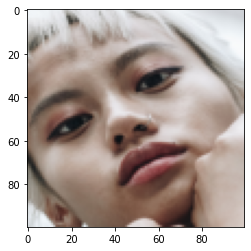

pred:  [0.02464598] truth:  0.0


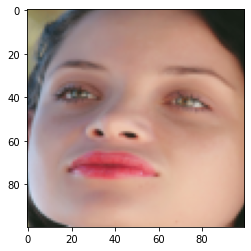

pred:  [0.09008521] truth:  0.0


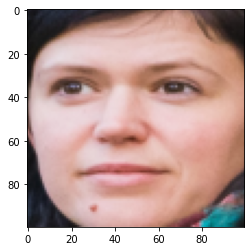

pred:  [0.42145658] truth:  0.0


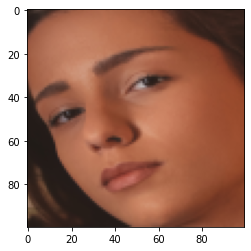

pred:  [0.37083983] truth:  0.0


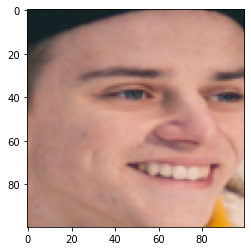

pred:  [0.9990246] truth:  0.0


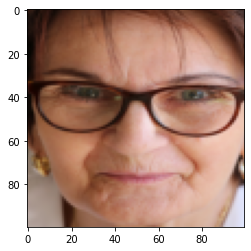

pred:  [1.6915836e-08] truth:  0.0


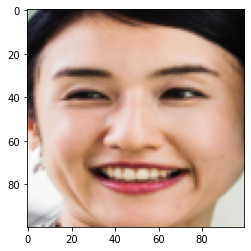

pred:  [0.43072155] truth:  0.0


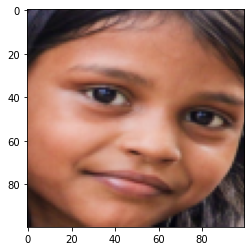

pred:  [0.7813598] truth:  1.0


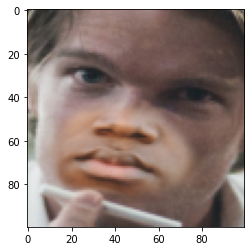

pred:  [3.9310825e-07] truth:  0.0


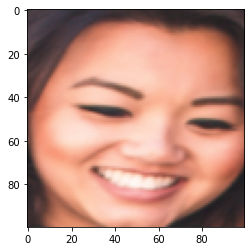

pred:  [0.00011952] truth:  0.0


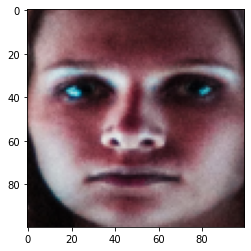

pred:  [0.999959] truth:  0.0


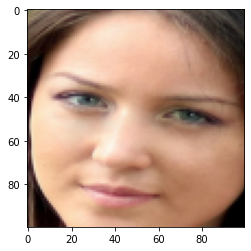

pred:  [0.42310277] truth:  0.0


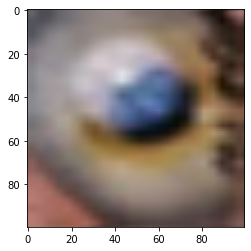

pred:  [0.00316566] truth:  0.0


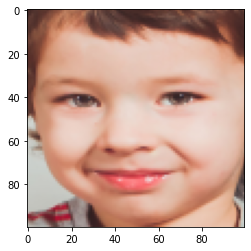

pred:  [0.6004078] truth:  0.0


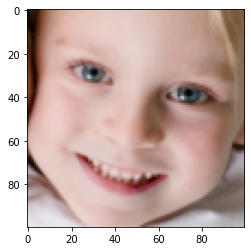

pred:  [0.00037619] truth:  1.0


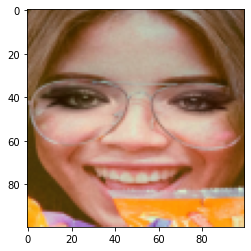

pred:  [0.26233572] truth:  1.0


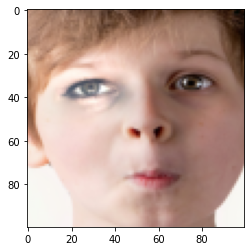

pred:  [0.00089771] truth:  0.0


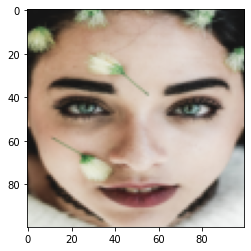

pred:  [6.247303e-05] truth:  0.0


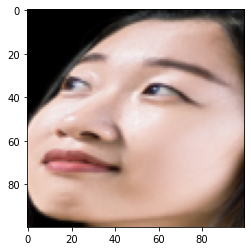

pred:  [0.5693143] truth:  0.0


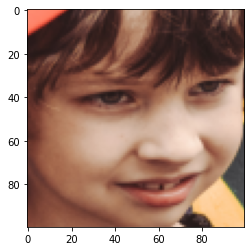

pred:  [0.00082576] truth:  1.0


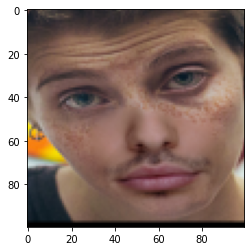

pred:  [0.7498429] truth:  0.0


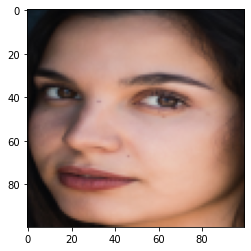

pred:  [0.45829767] truth:  0.0


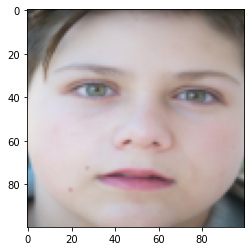

pred:  [0.00555602] truth:  0.0


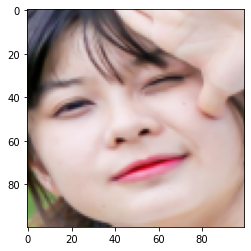

In [253]:
for i in range(preds.shape[0]):
    print('pred: ',preds[i], 'truth: ', y_test_c[i])
    plt.imshow(X_test_c[i])
    plt.show()

### Playing With MNIST

In [224]:
(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()

In [197]:
x_train = x_train.astype("float32") / 255
x_test = x_test.astype("float32") / 255
# Make sure images have shape (28, 28, 1)
x_train = np.expand_dims(x_train, -1)
x_test = np.expand_dims(x_test, -1)

In [198]:
y_train = keras.utils.to_categorical(y_train, 10)
y_test = keras.utils.to_categorical(y_test, 10)

In [203]:
def build_CNN_MNIST(X):
    model = Sequential()
    
    model.add(Conv2D(6, (3,3), activation='relu', input_shape=X.shape[1:]))
    model.add(Dropout(0.1))
    
    model.add(Conv2D(6, (3,3), activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Conv2D(16, (3,3), activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Conv2D(16, (3,3), activation='relu'))
    model.add(Dropout(0.1))
    
    model.add(Flatten())
    model.add(Dropout(0.4))

    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.4))

    model.add(Dense(10, activation='softmax'))
    
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

In [204]:
MNIST_model = build_CNN_MNIST(x_train)

In [205]:
MNIST_model.fit(x_train, y_train , epochs=5, batch_size=128, validation_split=0.1)

Epoch 1/5
422/422 [==============================] - 42s 98ms/step - loss: 0.5763 - accuracy: 0.8124 - val_loss: 0.0904 - val_accuracy: 0.9748
Epoch 2/5
422/422 [==============================] - 41s 98ms/step - loss: 0.2476 - accuracy: 0.9248 - val_loss: 0.0638 - val_accuracy: 0.9817
Epoch 3/5
422/422 [==============================] - 42s 99ms/step - loss: 0.1918 - accuracy: 0.9413 - val_loss: 0.0486 - val_accuracy: 0.9853
Epoch 4/5
422/422 [==============================] - 42s 98ms/step - loss: 0.1677 - accuracy: 0.9482 - val_loss: 0.0473 - val_accuracy: 0.9862
Epoch 5/5
422/422 [==============================] - 48s 113ms/step - loss: 0.1460 - accuracy: 0.9548 - val_loss: 0.0431 - val_accuracy: 0.9872


In [206]:
_, accuracy = MNIST_model.evaluate(x_test, y_test)
print(accuracy)

313/313 [==============================] - 2s 5ms/step - loss: 0.0486 - accuracy: 0.9852
0.9851999878883362
